<a href="https://colab.research.google.com/github/Shadows-Puppet/CGL/blob/main/Aria_mp4_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#using this notebook to test all the aria features, will later reproduce on a linux machine

In [1]:
!pip install projectaria_tools'[all]' moviepy
!pip install rerun-sdk==0.20.0
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 73.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 109.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.9/386.9 kB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 68.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.9 MB/s eta 0:00:00
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting uninstall: jupyter-server
    Found existing installation: jupyter-server 1.16.0
    Uninst

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╸ 363.4/363.4 MB 113.4 MB/s eta 0:00:01^C


In [48]:
from projectaria_tools.core import data_provider, image
from projectaria_tools.core.stream_id import StreamId

vrsfile = "Computer_vision.vrs"
provider = data_provider.create_vrs_data_provider(vrsfile)

stream_id = provider.get_stream_id_from_label("camera-slam-left")
image_data =  provider.get_image_data_by_index(stream_id, 0)
pixel_frame = image_data[0].pixel_frame
image_array = image_data[0].to_numpy_array()

In [58]:
from PIL import Image
from projectaria_tools.core import data_provider, calibration, image
import numpy as np
stream_mappings = {
    #"camera-slam-left": StreamId("1201-1"),
    #"camera-slam-right": StreamId("1201-2"),
    "camera-rgb": StreamId("214-1"),
    #"camera-eyetracking": StreamId("211-1"),
}
provider.set_color_correction(True)
calib = provider.get_device_calibration().get_camera_calib("camera-rgb")
pinhole = calibration.get_linear_camera_calibration(512, 512, 150)

for index in range(0,421,30):
  for [stream_name, stream_id] in stream_mappings.items():
      image_data = provider.get_image_data_by_index(stream_id, index)
      image_data = image_data[0].to_numpy_array()
      undistorted_image = calibration.distort_by_calibration(image_data, pinhole, calib)
      # Rotated image by CW90 degrees
      rotated_image = np.rot90(undistorted_image, k=3)

      Image.fromarray(rotated_image).save(f'{stream_name}{index}.png')

In [30]:
!pip install ultralytics
!pip install segment-anything

In [52]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load YOLOv8 model (pretrained on COCO)
model = YOLO('yolov8m.pt')  # try 'yolov8s.pt' for better accuracy

# Read the image
frame = cv2.imread('camera-rgb.png')

# Convert from BGR (OpenCV default) to RGB (for displaying with matplotlib)
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Run detection
results = model.predict(source=frame_rgb, conf=0.4)

# Draw boxes and labels on the frame
for result in results:
    for box in result.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        label = result.names[int(box.cls[0])]
        cv2.rectangle(frame_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(frame_rgb, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.9, (255, 0, 0), 2)

# Display using matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(frame_rgb)
plt.axis('off')
plt.title('Detected Objects')
plt.show()



error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
from projectaria_tools.core.stream_id import StreamId
from projectaria_tools.core.vrs import VRSReader

reader = VRSReader()
reader.open("your_file.vrs")

# Get available streams (e.g., 'camera-rgb', 'camera-slam-left', etc.)
stream_ids = reader.get_stream_ids()

# Choose the stream you want (typically 'camera-rgb' or 'camera-slam-left')
stream_id = StreamId("camera-slam-left")

# Read first 10 frames from the stream
for i, record in enumerate(reader.read_stream_records(stream_id)):
    frame = record.image().to_numpy()

    # Convert to RGB for OpenCV/matplotlib
    import cv2
    import matplotlib.pyplot as plt

    rgb = cv2.cvtColor(frame, cv2.COLOR_GRAY2RGB)  # Or COLOR_BGR2RGB if needed

    plt.imshow(rgb)
    plt.title(f"Frame {i}")
    plt.axis("off")
    plt.show()

    if i == 9:
        break


ImportError: cannot import name 'VRSReader' from 'projectaria_tools.core.vrs' (/usr/local/lib/python3.11/dist-packages/projectaria_tools/core/vrs.py)


0: 640x640 1 person, 2 chairs, 1 potted plant, 1 tv, 1 cell phone, 2 refrigerators, 1 clock, 1 vase, 1 teddy bear, 1358.8ms
Speed: 5.5ms preprocess, 1358.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


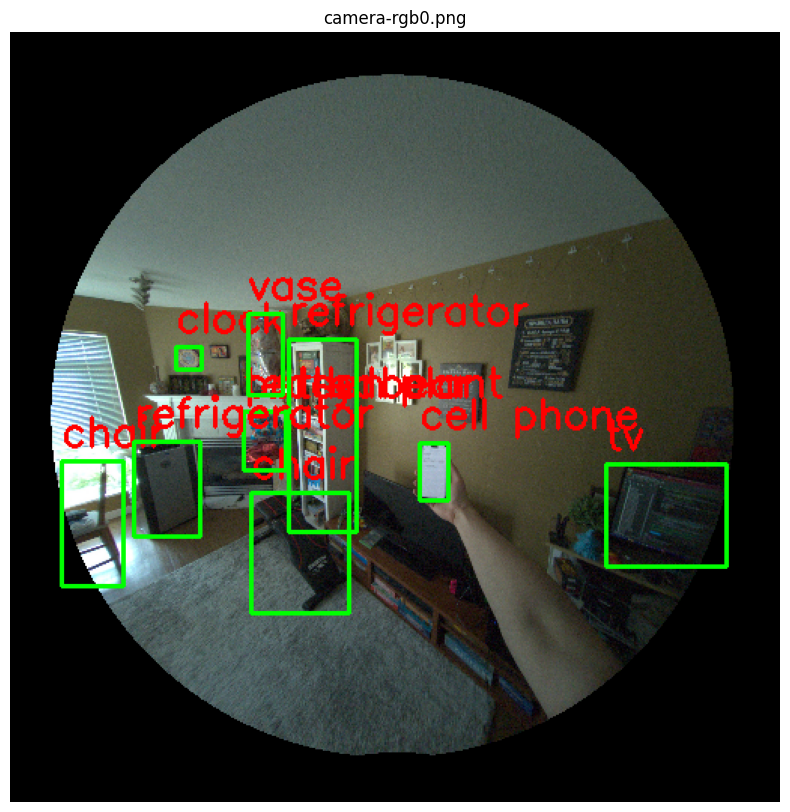


0: 640x640 1 tv, 1 laptop, 4 keyboards, 1349.4ms
Speed: 5.4ms preprocess, 1349.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


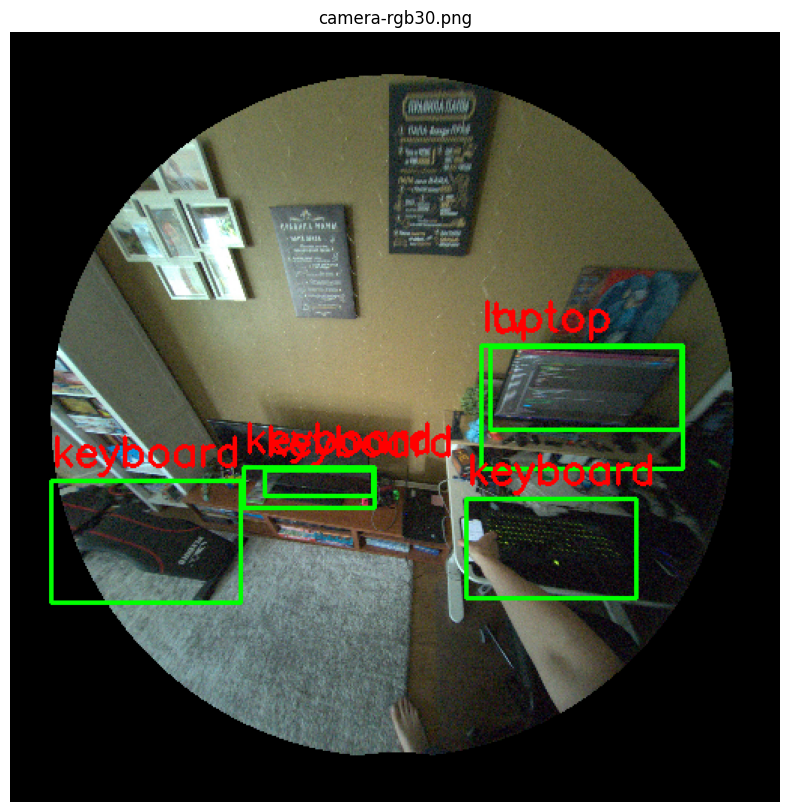


0: 640x640 1 potted plant, 2 tvs, 1 mouse, 3 keyboards, 1 book, 1361.7ms
Speed: 5.6ms preprocess, 1361.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


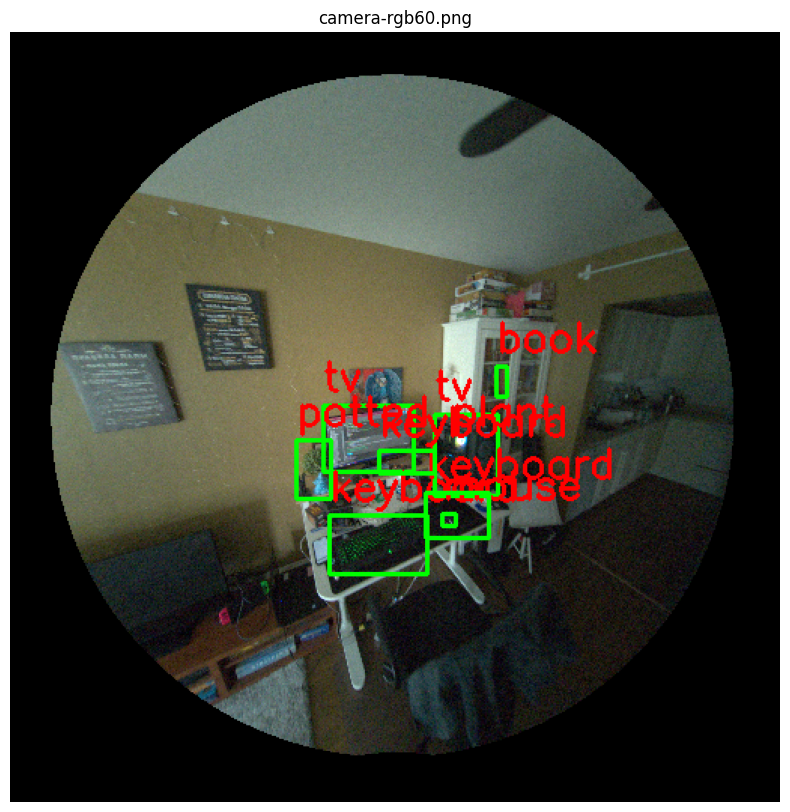


0: 640x640 1 cup, 3 chairs, 1 tv, 2 sinks, 1 book, 1388.5ms
Speed: 5.5ms preprocess, 1388.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


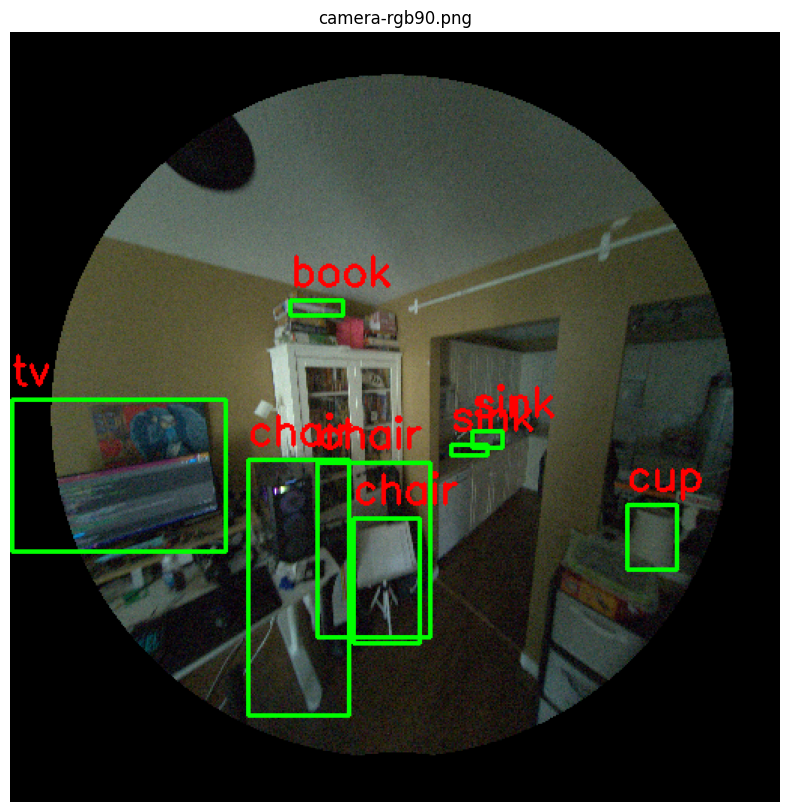


0: 640x640 1 bed, 8 books, 1543.9ms
Speed: 5.6ms preprocess, 1543.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


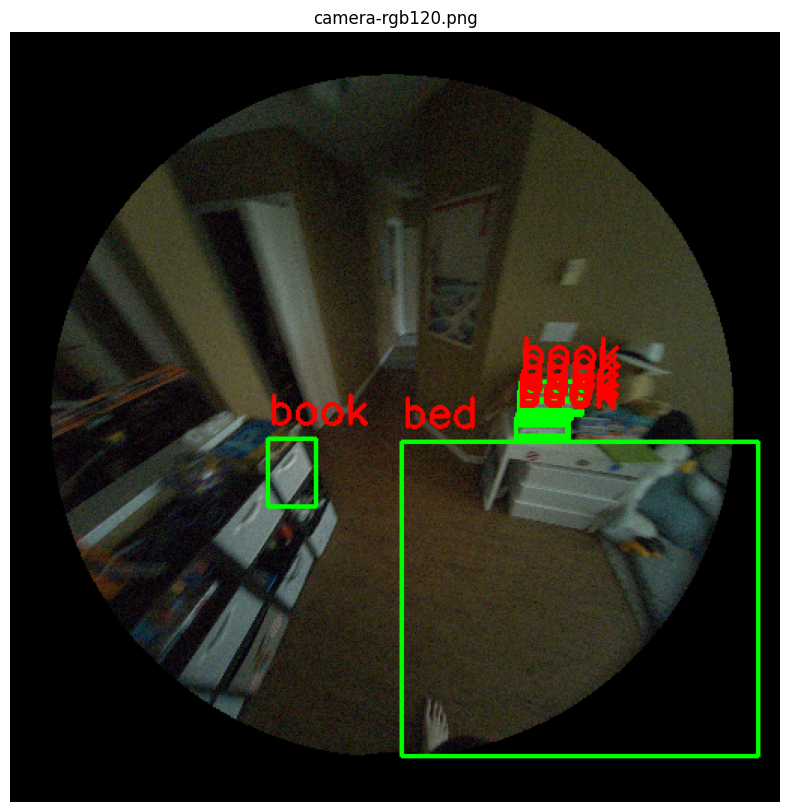


0: 640x640 7 chairs, 2 dining tables, 1 clock, 2082.4ms
Speed: 5.5ms preprocess, 2082.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


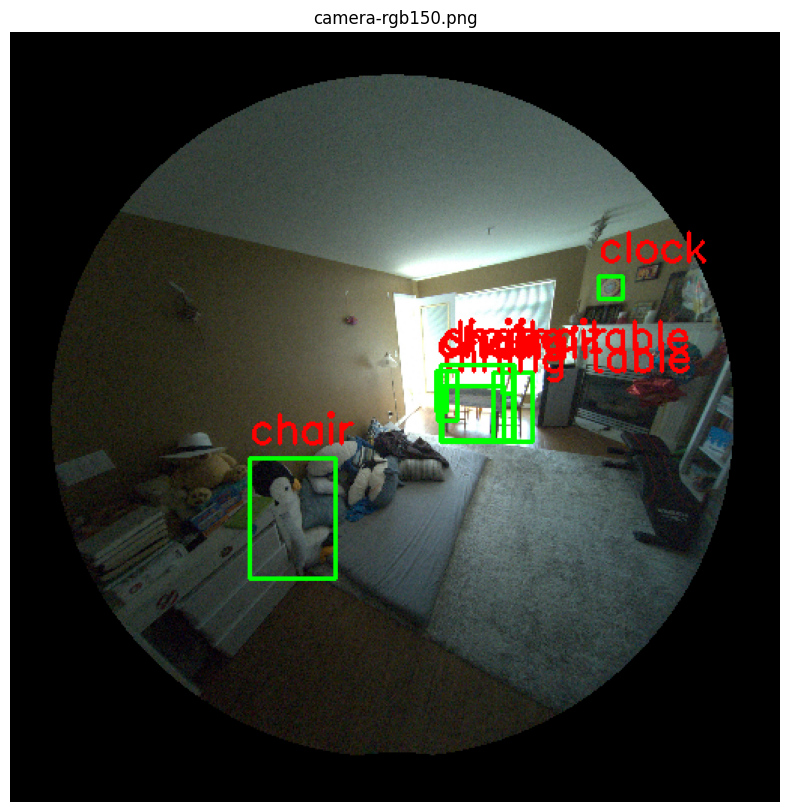


0: 640x640 1 tv, 3 laptops, 2 keyboards, 9 books, 1396.3ms
Speed: 5.7ms preprocess, 1396.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


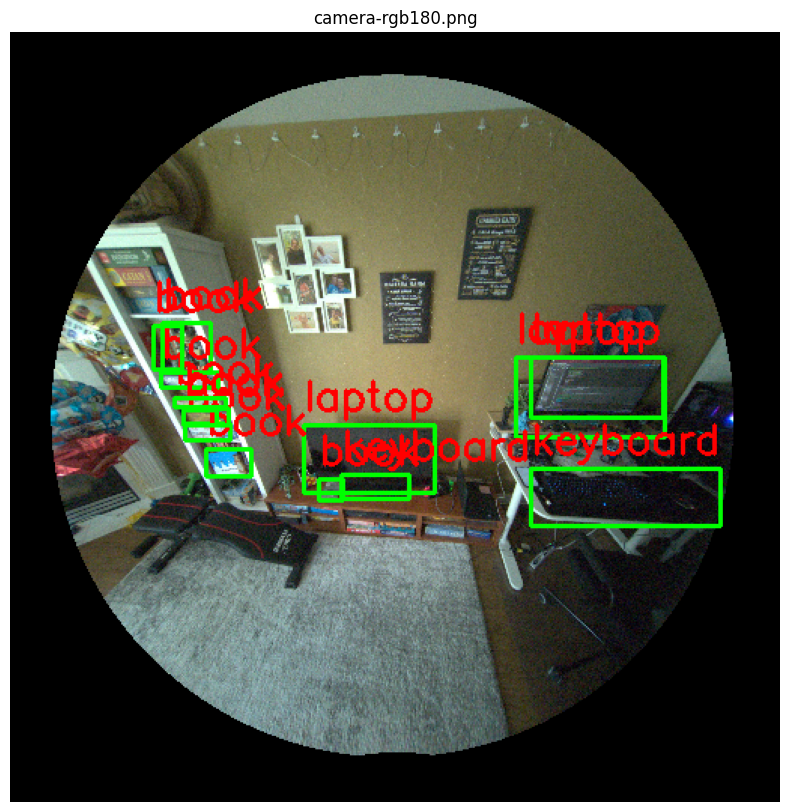


0: 640x640 1 backpack, 4 chairs, 1 refrigerator, 13 books, 1 clock, 1406.8ms
Speed: 5.6ms preprocess, 1406.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


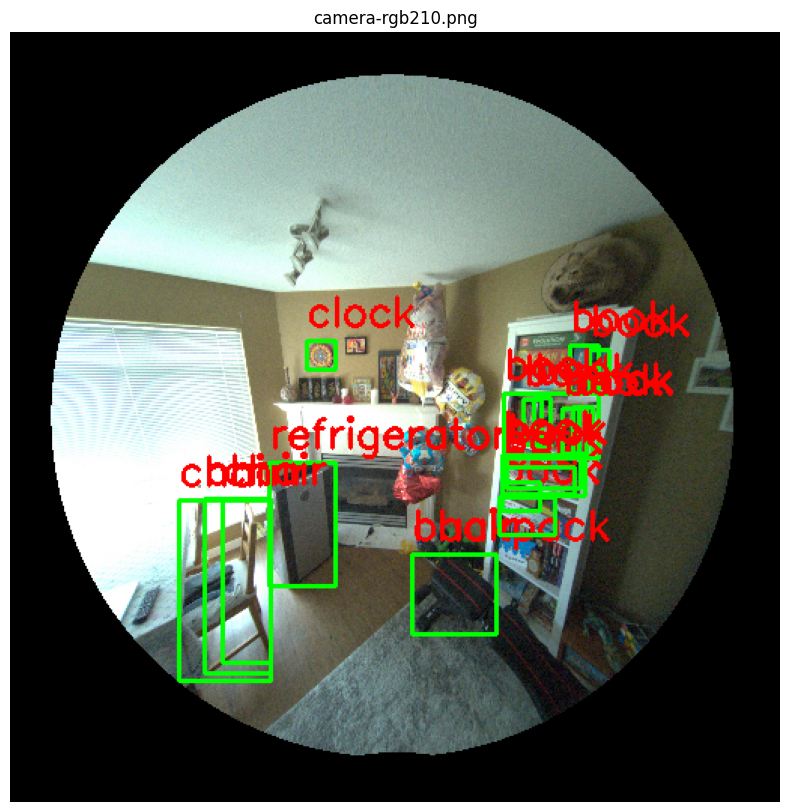


0: 640x640 2 chairs, 1 bed, 1 dining table, 1 teddy bear, 1409.0ms
Speed: 5.5ms preprocess, 1409.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


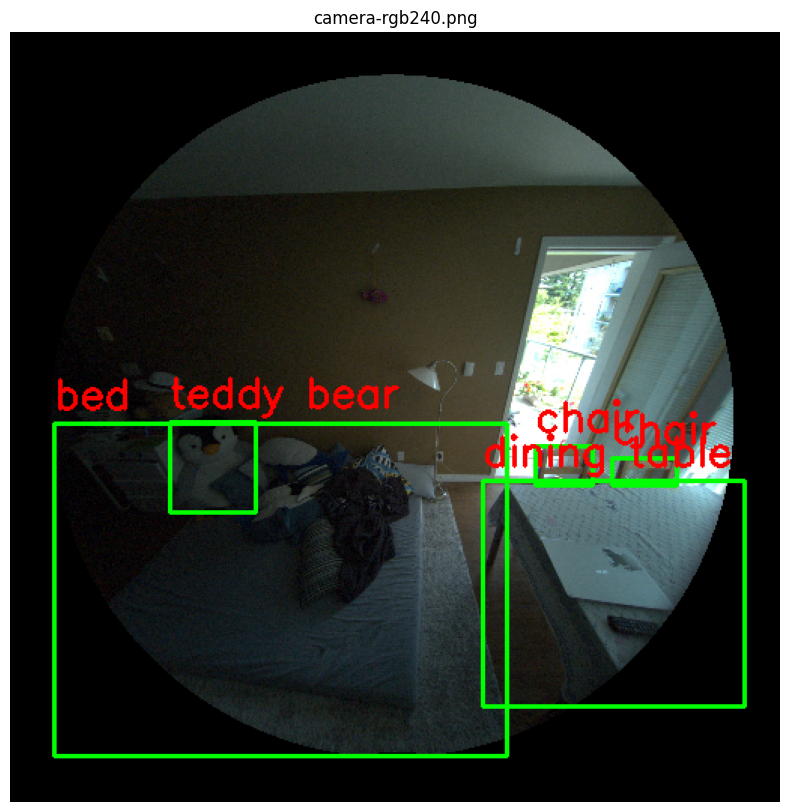


0: 640x640 3 chairs, 2 tvs, 1 keyboard, 6 books, 1450.5ms
Speed: 5.5ms preprocess, 1450.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


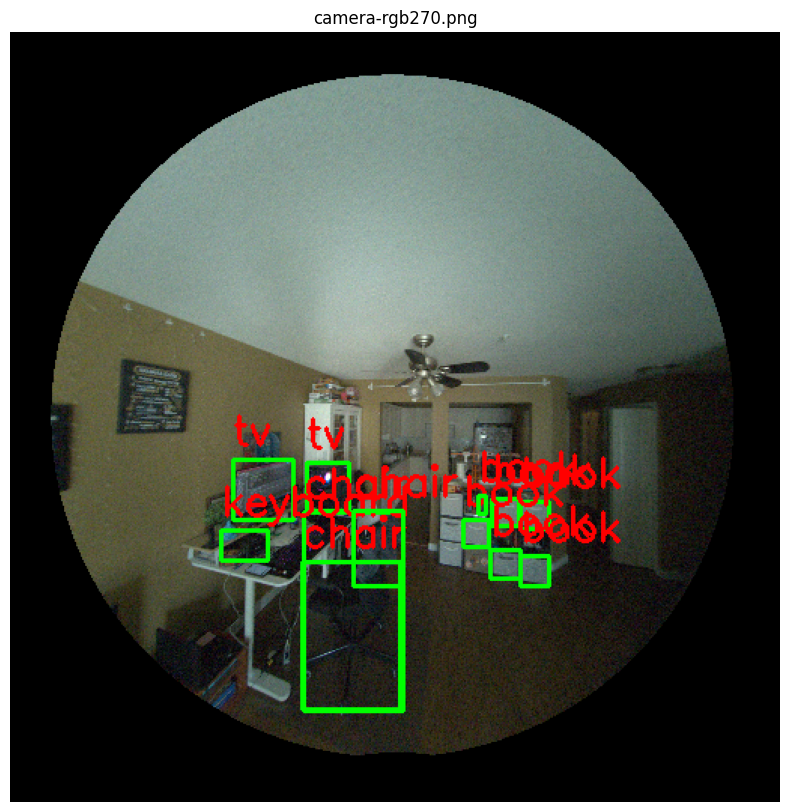


0: 640x640 4 chairs, 1 dining table, 1 tv, 1 refrigerator, 2 books, 1 clock, 1464.2ms
Speed: 5.6ms preprocess, 1464.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


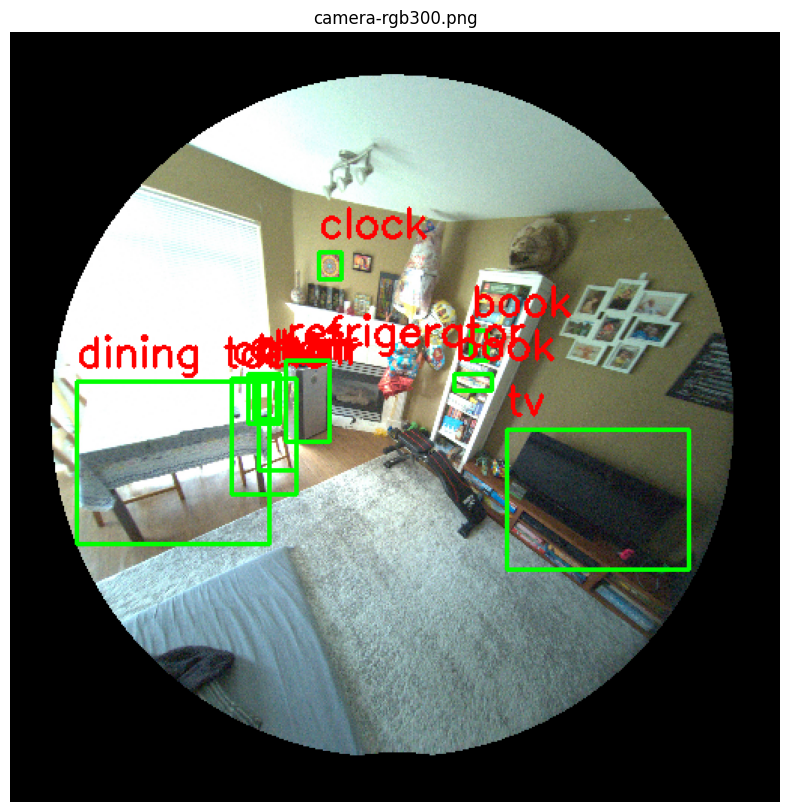


0: 640x640 1 refrigerator, 2115.9ms
Speed: 7.8ms preprocess, 2115.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


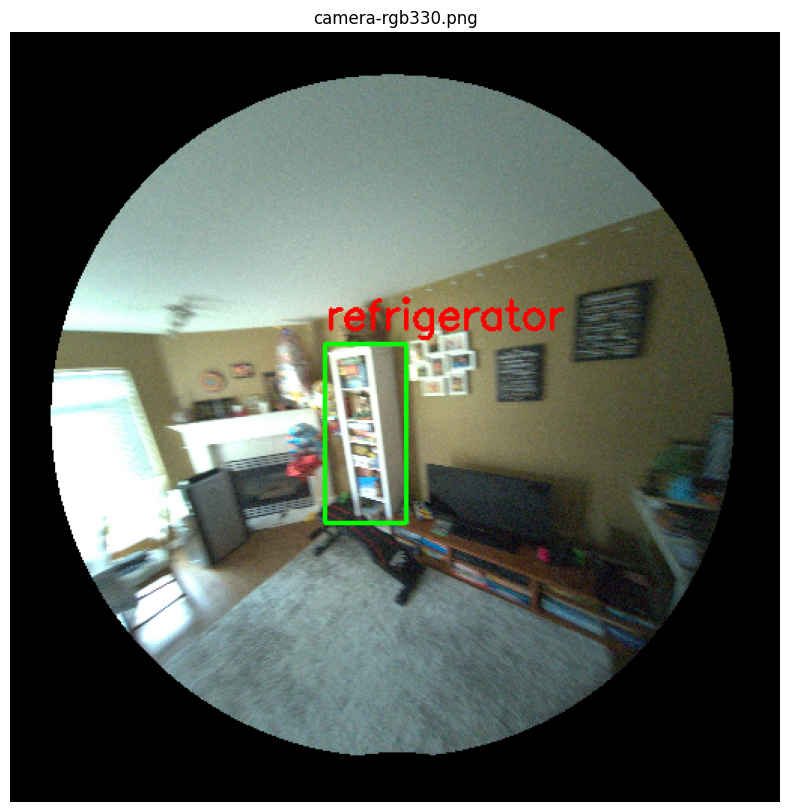


0: 640x640 1 bowl, 1 tv, 5 books, 1486.7ms
Speed: 5.4ms preprocess, 1486.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


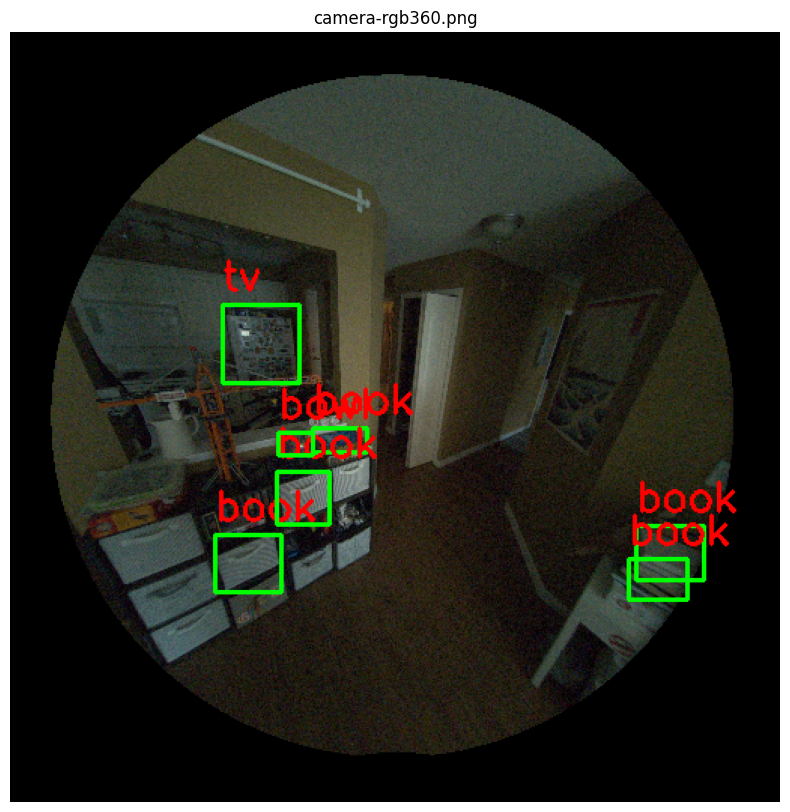


0: 640x640 3 chairs, 1 tv, 1 remote, 2 keyboards, 11 books, 1495.4ms
Speed: 5.5ms preprocess, 1495.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


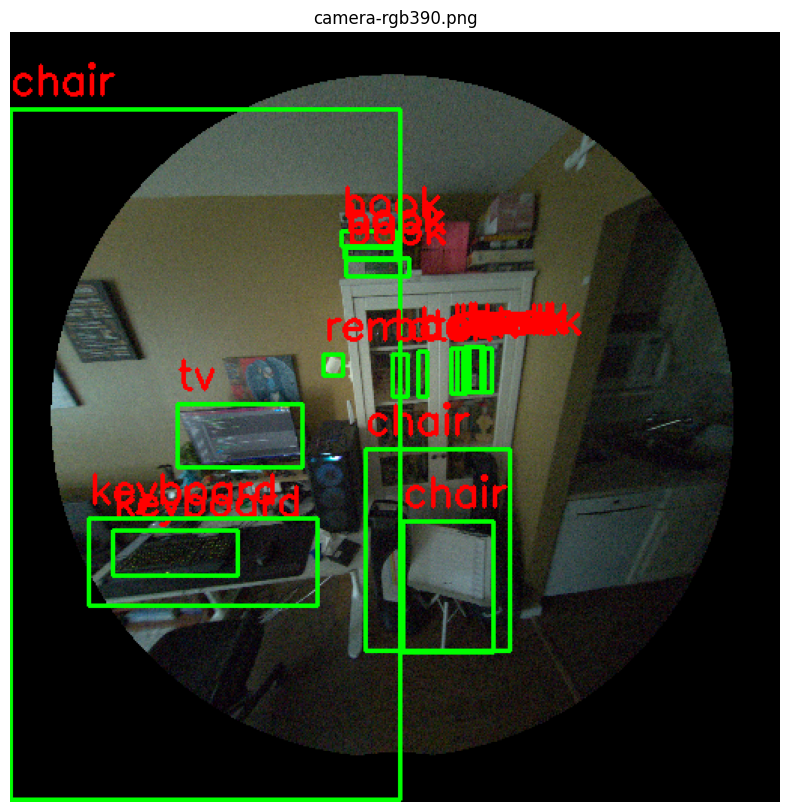


0: 640x640 (no detections), 1489.4ms
Speed: 5.4ms preprocess, 1489.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


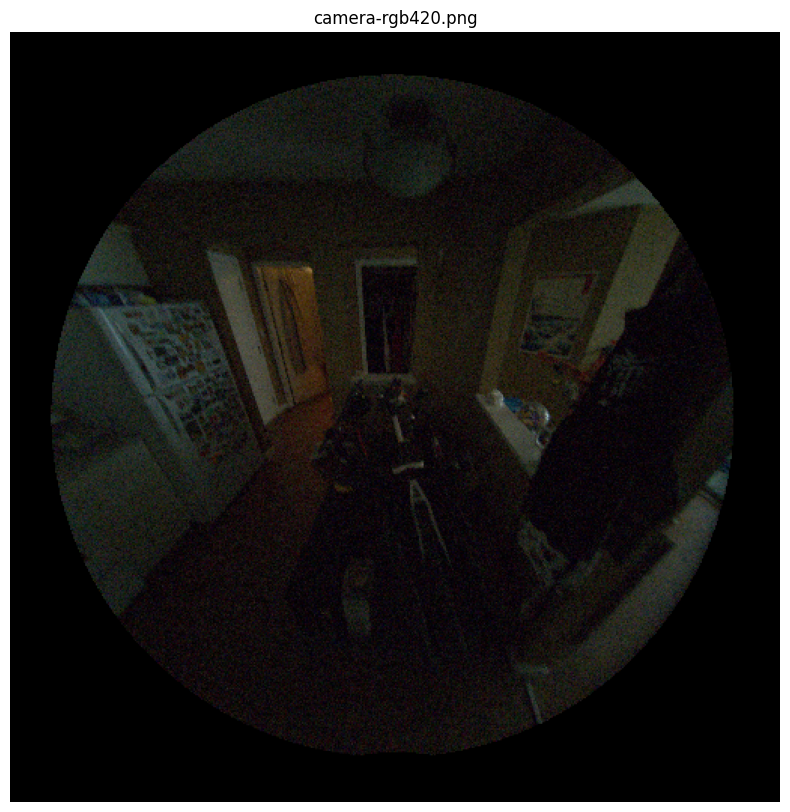

In [61]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image

# Load YOLOv8 model
model = YOLO('yolov8m.pt')  # or yolov8s.pt for better performance on small objects

# Directory containing saved images
image_dir = './'  # or use the full path
output_dir = './output'
os.makedirs(output_dir, exist_ok=True)

# Get all image files that match your naming pattern
image_files = ['camera-rgb' + str(i) + '.png' for i in range(0,421,30)]

for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Read image
    frame = cv2.imread(image_path)
    if frame is None:
        print(f"Could not read {image_file}")
        continue

    # Convert to RGB
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Run YOLO detection
    results = model.predict(source=frame_rgb, conf=0.1)

    # Draw boxes
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            label = result.names[int(box.cls[0])]
            cv2.rectangle(frame_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame_rgb, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        0.9, (255, 0, 0), 2)

    # Save the result
    output_path = os.path.join(output_dir, f"detected_{image_file}")
    Image.fromarray(frame_rgb).save(output_path)

    # Optionally show result
    plt.figure(figsize=(10, 10))
    plt.imshow(frame_rgb)
    plt.title(image_file)
    plt.axis('off')
    plt.show()
